## General Analysis
- **Target:**  ***pm2_5*** is our target, this is a regression problem.
- **Shape:** </br>
    - *Train Set Shape:* (8071, 80) </br>
    - *Test Set Shape:* (2783, 79)
- **Features Types:**
    - Almost all of our features are of type ***float64***
    - the column ***hour*** is the only column of type ***int64***
    - We have 5 columns with type ***object*** which are : ***id and site_id (both irrelevant), city, country, date (seems irrelvant aswell)***
- **Missing Values:** There seems to be a lot of missing values in our dataset, to be more precise :
    - The ***uvaerosollayerheight*** group of features appears to have ***94.7095%*** missing values. This group of features will be most likely dropped as it is almost impossible to work with this much missing values.
    - The ***nitrogendioxide*** group of features appears to have ***61.5413%*** missing values. This is still a lot, dropping this group also seems to be the best approach but will need further investigation first.
    - The ***sulphurdioxide*** group of features appears to have ***60.8599%*** missing values. This is the same situation as the previous group of features.
    - The feature groups ***formaldehyde, carbonmonoxide*** and ***cloud*** have less than ***50%*** missing values, respectively ***48.5070%, 44.9758%*** and ***38.1241%***. Keeping them is a strong possibility.
    - The rest of the features have either no missing values or a very small percentage like ***ozone*** and ***uvaerosolindex*** with respectively ***1.3877%*** and ***0.0620%*** 
- **Notes:**
    - ***id*** and ***site_id*** are pointless so they will be dropped
    - ***site_latitude, site_longitude, city*** and ***country*** seem to be referring to the same thing. </br>
        Possibilities : </br>
            - Leave them as they are. </br>
            - Keep only one, ***city*** for example. </br>
            - Create a new feature combining ***site_latitude*** and ***site_longitude*** and drop the rest.
      
    - Do the columns ***date, hour*** and ***month*** matter ? Will need further investigation. ***date*** seems to be useless
    - It seems that we have several features groups : </br>
        -  ***sulphurdioxide***
        -  ***carbonmonoxide***
        -  ***nitrogendioxide***
        -  ***formaldehyde***
        -  ***uvaerosolindex***
        -  ***ozone***
        -  ***uvaerosollayer***
        -  ***cloud***
     
## Univariate Analysis
- **Target Distribution:** The distribution is skewed to the right and contains a heavy tail. Pre-processing the target is a viable option but not a strong priority
- **Numerical Features Distribution:** Some of the features are centered in 0 but don't have a standard deviation of 1, other features have weird distributions some resembling categorical distributions. Most of them will need to be normalized but this is not a priority
- **Categorical Features Distribution:** The city and country features are the same. The problem is they are not evenly distributed. Will maybe need further analysis.

## Bivariate Analysis
- **Target / Nitrogendioxide:**
- **Target / Sulphurdioxide:**
- **Target / Formaldehyde:**
- **Target / Carbonmonoxide:**
- **Target / Cloud:**
- **Target / Ozone:**
- **Target / City:**

## Correlation
- There are no strong correlations between the ***target*** and the other variables, the strongest being at 0.42
- A lot of Variables are very strongly correlated having a corraltion of 100%. This will need a more in depth analysis. This will probably lead to a lot of columns being dropped.

## Outliers
- The ***target*** seems to have outliers.
- Some features seem to have outliers aswell.

## Adversarial Validation
aaa

# Exploratory Data Analysis

## Imports

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns

%matplotlib inline

pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows", None)

sns.set_theme(style='white', palette='viridis')
pal = sns.color_palette('viridis')

import warnings
warnings.filterwarnings("ignore")

In [2]:
train = pd.read_csv("data/Train.csv")
test = pd.read_csv("data/Test.csv")

df = train.copy()

## Overview

In [3]:
df.head()

,id,site_id,site_latitude,site_longitude,city,country,date,hour,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,month,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,uvaerosollayerheight_aerosol_height,uvaerosollayerheight_aerosol_pressure,uvaerosollayerheight_aerosol_optical_depth,uvaerosollayerheight_sensor_zenith_angle,uvaerosollayerheight_sensor_azimuth_angle,uvaerosollayerheight_solar_azimuth_angle,uvaerosollayerheight_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5
0,id_vjcx08sz91,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,2023-10-25,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,10.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.052301,828817.9375,-100.805145,21.720518,-123.523796,33.745914,0.122055,2.301404,0.285803,230.693756,0.906039,-100.805145,21.720518,-123.523796,33.745914,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.015000
1,id_bkg215syli,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,2023-11-02,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,0.045475,3771.027210,3399.756845,828569.623806,69.245351,59.159695,-143.370575,26.566997,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000214,1.462390,0.000240,0.359150,26.525513,-143.480164,59.220097,70.875954,-0.315206,828578.6250,70.875954,59.220097,-143.480164,26.525513,0.116975,3.049902,0.362203,228.260193,0.364713,70.875954,59.220097,-143.480164,26.525513,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,42.267200
2,id_oui2pot3qd,6531a46a89b3300013914a36,6.53257,3.39936,Lagos,Nigeria,2023-11-03,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.097816,828878.6875,-96.411942,61.045010,-121.307121,41.898113,0.117559,3.248703,0.384168,224.102463,0.754163,-96.411942,61.045010,-121.307121,41.898113,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.7

In [4]:
train.shape, test.shape

((8071, 80), (2783, 79))

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8071 entries, 0 to 8070
Data columns (total 80 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   id                                                        8071 non-null   object 
 1   site_id                                                   8071 non-null   object 
 2   site_latitude                                             8071 non-null   float64
 3   site_longitude                                            8071 non-null   float64
 4   city                                                      8071 non-null   object 
 5   country                                                   8071 non-null   object 
 6   date                                                      8071 non-null   object 
 7   hour                                                      8071 non-null   int64  
 8   sulphurdioxide_so2

In [6]:
df.describe()

,site_latitude,site_longitude,hour,sulphurdioxide_so2_column_number_density,sulphurdioxide_so2_column_number_density_amf,sulphurdioxide_so2_slant_column_number_density,sulphurdioxide_cloud_fraction,sulphurdioxide_sensor_azimuth_angle,sulphurdioxide_sensor_zenith_angle,sulphurdioxide_solar_azimuth_angle,sulphurdioxide_solar_zenith_angle,sulphurdioxide_so2_column_number_density_15km,month,carbonmonoxide_co_column_number_density,carbonmonoxide_h2o_column_number_density,carbonmonoxide_cloud_height,carbonmonoxide_sensor_altitude,carbonmonoxide_sensor_azimuth_angle,carbonmonoxide_sensor_zenith_angle,carbonmonoxide_solar_azimuth_angle,carbonmonoxide_solar_zenith_angle,nitrogendioxide_no2_column_number_density,nitrogendioxide_tropospheric_no2_column_number_density,nitrogendioxide_stratospheric_no2_column_number_density,nitrogendioxide_no2_slant_column_number_density,nitrogendioxide_tropopause_pressure,nitrogendioxide_absorbing_aerosol_index,nitrogendioxide_cloud_fraction,nitrogendioxide_sensor_altitude,nitrogendioxide_sensor_azimuth_angle,nitrogendioxide_sensor_zenith_angle,nitrogendioxide_solar_azimuth_angle,nitrogendioxide_solar_zenith_angle,formaldehyde_tropospheric_hcho_column_number_density,formaldehyde_tropospheric_hcho_column_number_density_amf,formaldehyde_hcho_slant_column_number_density,formaldehyde_cloud_fraction,formaldehyde_solar_zenith_angle,formaldehyde_solar_azimuth_angle,formaldehyde_sensor_zenith_angle,formaldehyde_sensor_azimuth_angle,uvaerosolindex_absorbing_aerosol_index,uvaerosolindex_sensor_altitude,uvaerosolindex_sensor_azimuth_angle,uvaerosolindex_sensor_zenith_angle,uvaerosolindex_solar_azimuth_angle,uvaerosolindex_solar_zenith_angle,ozone_o3_column_number_density,ozone_o3_column_number_density_amf,ozone_o3_slant_column_number_density,ozone_o3_effective_temperature,ozone_cloud_fraction,ozone_sensor_azimuth_angle,ozone_sensor_zenith_angle,ozone_solar_azimuth_angle,ozone_solar_zenith_angle,uvaerosollayerheight_aerosol_height,uvaerosollayerheight_aerosol_pressure,uvaerosollayerheight_aerosol_optical_depth,uvaerosollayerheight_sensor_zenith_angle,uvaerosollayerheight_sensor_azimuth_angle,uvaerosollayerheight_solar_azimuth_angle,uvaerosollayerheight_solar_zenith_angle,cloud_cloud_fraction,cloud_cloud_top_pressure,cloud_cloud_top_height,cloud_cloud_base_pressure,cloud_cloud_base_height,cloud_cloud_optical_depth,cloud_surface_albedo,cloud_sensor_azimuth_angle,cloud_sensor_zenith_angle,cloud_solar_azimuth_angle,cloud_solar_zenith_angle,pm2_5
count,8071.000000,8071.000000,8071.000000,3159.000000,3159.000000,3159.000000,3159.000000,3159.000000,3159.000000,3159.000000,3159.000000,3159.000000,8071.000000,4441.000000,4441.000000,4441.000000,4441.000000,4441.000000,4441.000000,4441.000000,4441.000000,3104.000000,3104.000000,3104.000000,3104.000000,3104.000000,3104.000000,3104.000000,3104.000000,3104.000000,3104.000000,3104.000000,3104.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,4156.000000,8066.000000,8066.000000,8066.000000,8066.000000,8066.000000,8066.000000,7959.000000,7959.000000,7959.000000,7959.000000,7959.000000,7959.000000,7959.000000,7959.000000,7959.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,427.000000,4994.000000,4994.000000,4994.000000,4994.000000,4994.000000,4994.000000,4994.000000,4994.000000,4994.000000,4994.000000,4994.000000,8071.000000
mean,0.635678,30.246982,10.877463,0.000024,0.687295,0.000013,0.126581,2.120939,38.671939,-92.912582,27.700157,0.000004,6.122414,0.034887,2200.218221,2041.463881,829573.191993,-8.063021,38.482742,-91.507702,28.609344,0.000074,0.000040,0.000033,0.000130,8836.367723,-0.369219,0.081754,829581.679425,-12.334603,37.299477,-93.711870,28.807872,0.000175,1.046935,0.000109,0.192196,28.036877,-92.363482,40.218543,-2.760999,-0.442617,829596.648655,-12.608537,41.387619,-88.902996,28.385504,0.117739,2.650292,0.316414,228.241939,0.516471,-13.304661,41.293259,-88.650645,28.541850,2217.913597,78611.503814,1.880600,

## Missing values

<Axes: >

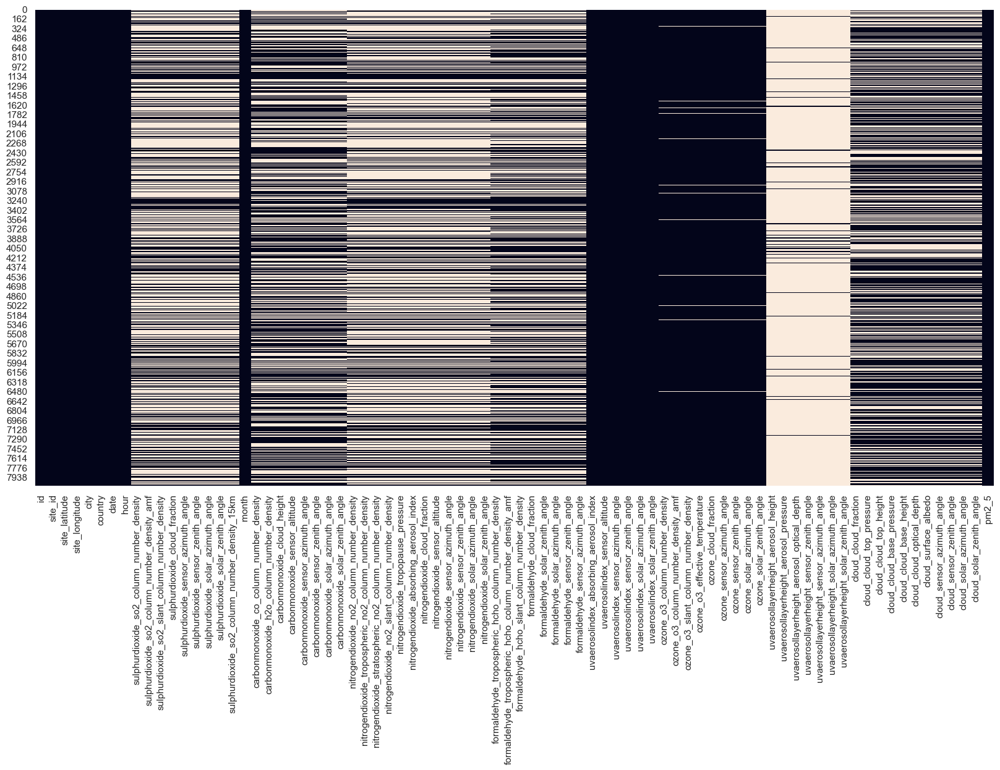

In [7]:
plt.figure(figsize=(20,10))
sns.heatmap(df.isna(), cbar=False)

In [8]:
missing_df = pd.DataFrame(df.isna().mean(axis=0).sort_values(ascending=False), columns=['% of Missing Values'])
missing_df

,% of Missing Values
uvaerosollayerheight_aerosol_height,0.947095
uvaerosollayerheight_solar_zenith_angle,0.947095
uvaerosollayerheight_solar_azimuth_angle,0.947095
uvaerosollayerheight_sensor_azimuth_angle,0.947095
uvaerosollayerheight_sensor_zenith_angle,0.947095
uvaerosollayerheight_aerosol_optical_depth,0.947095
uvaerosollayerheight_aerosol_pressure,0.947095
nitrogendioxide_no2_slant_column_number_density,0.615413
nitrogendioxide_no2_column_number_density,0.615413
nitrogendioxide_tropospheric_no2_column_number_density,0.615413


## Target Distribution 

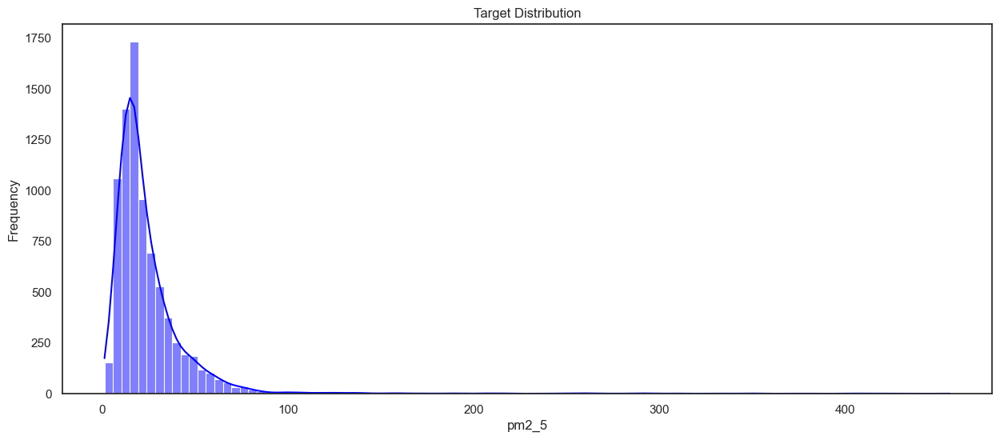

In [9]:
plt.figure(figsize=(15, 6))
sns.histplot(df['pm2_5'], color='b', bins=100, kde=True);
plt.title('Target Distribution')
plt.xlabel('pm2_5')
plt.ylabel('Frequency')
plt.show()

## Dropping Useless Columns

In [3]:
missing_percent = df.isnull().mean()
columns_to_drop = missing_percent[missing_percent > 0.9].index
columns_to_drop

Index(['uvaerosollayerheight_aerosol_height',
       'uvaerosollayerheight_aerosol_pressure',
       'uvaerosollayerheight_aerosol_optical_depth',
       'uvaerosollayerheight_sensor_zenith_angle',
       'uvaerosollayerheight_sensor_azimuth_angle',
       'uvaerosollayerheight_solar_azimuth_angle',
       'uvaerosollayerheight_solar_zenith_angle'],
      dtype='object')

In [4]:
df.drop(columns=columns_to_drop, inplace=True)
df.drop('id', axis=1, inplace=True)
df.drop('site_id', axis=1, inplace=True)

## Numerical Features Distribution 

In [22]:
numerical_features = df.select_dtypes(include=['int64', 'float64']).columns
numerical_features = numerical_features[:-1]

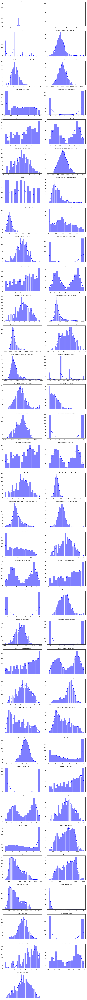

In [23]:
num_cols = 2
num_rows = len(numerical_features) // num_cols + (len(numerical_features) % num_cols > 0)

fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 5*num_rows))
axes = axes.flatten()

for i, column in enumerate(numerical_features):
    ax = axes[i]
    sns.histplot(df[column], kde=True, ax=ax, color='b')
    ax.set_title(column)
    ax.set_xlabel('')
    ax.set_ylabel('')

for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

## Categorical Features Distribution

In [28]:
categorical_features = df.select_dtypes(include=['object']).columns
categorical_features = categorical_features[:-1]
categorical_features

Index(['city', 'country'], dtype='object')

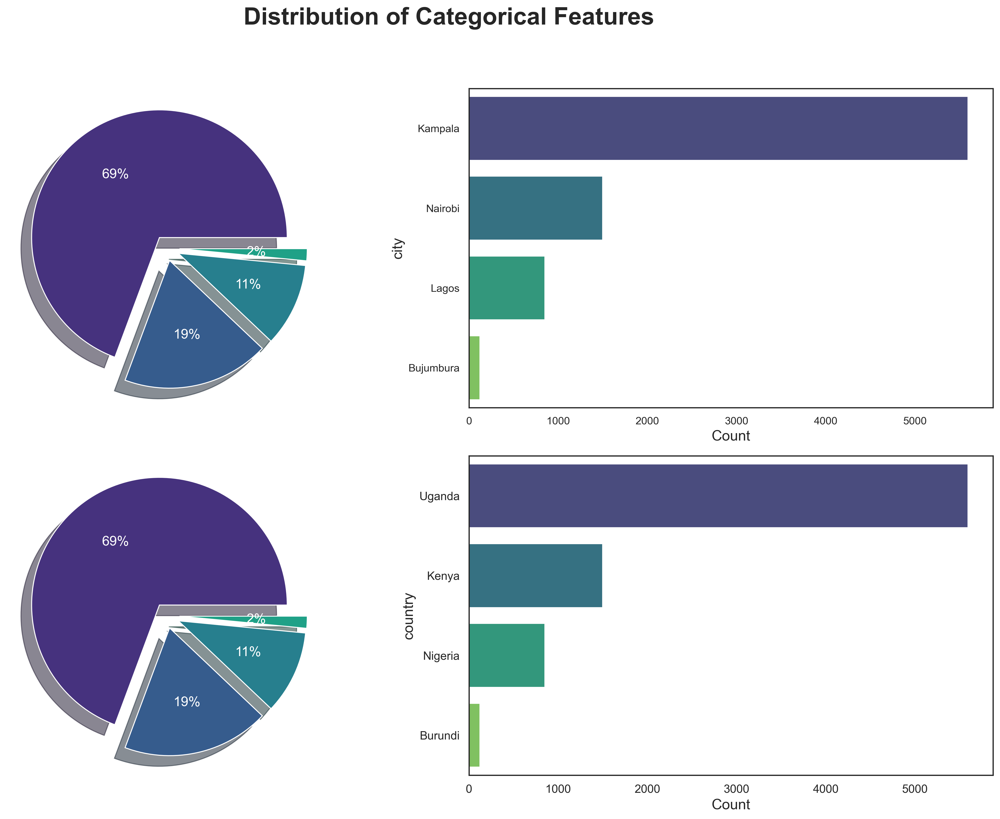

In [29]:
fig, ax = plt.subplots(2, 2, figsize = (16, 12), dpi = 300)

for i, column in enumerate(categorical_features):

    ax[i][0].pie(
        df[column].value_counts(), 
        shadow = True, 
        explode = [.1 for i in range(train[column].nunique())], 
        autopct = '%1.f%%',
        textprops = {'size' : 14, 'color' : 'white'}
    )

    sns.countplot(data = df, y = column, ax = ax[i][1], palette = 'viridis', order = df[column].value_counts().index)
    ax[i][1].yaxis.label.set_size(20)
    plt.yticks(fontsize = 12)
    ax[i][1].set_xlabel('Count', fontsize = 15)
    ax[i][1].set_ylabel(f'{column}', fontsize = 15)
    plt.xticks(fontsize = 12)

fig.suptitle('Distribution of Categorical Features\n\n', fontsize = 25, fontweight = 'bold')
plt.tight_layout()

## Creating Subsets 

In [5]:
nitrogendioxide_columns = [col for col in df.columns if col.startswith('nitrogendioxide')]
sulphurdioxide_columns = [col for col in df.columns if col.startswith('sulphurdioxide')]
formaldehyde_columns =  [col for col in df.columns if col.startswith('formaldehyde')]
carbonmonoxide_columns =  [col for col in df.columns if col.startswith('carbonmonoxide')]
cloud_columns =  [col for col in df.columns if col.startswith('cloud')]
ozone_columns = [col for col in df.columns if col.startswith('ozone')]
uvaerosolindex_columns =  [col for col in df.columns if col.startswith('uvaerosolindex')]

## Relations

### Relation Target / Nitrogendioxide

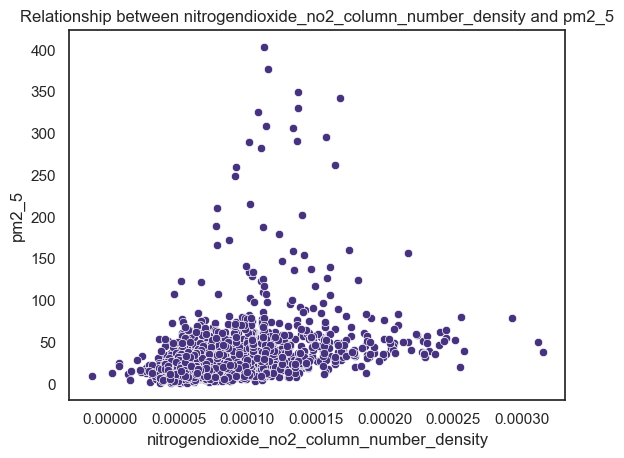

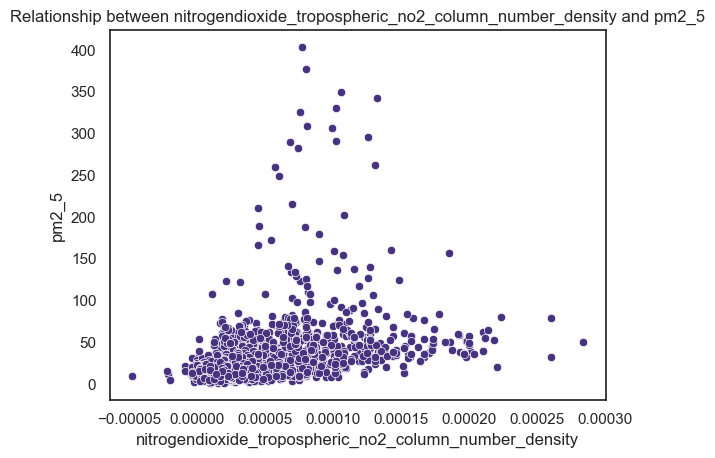

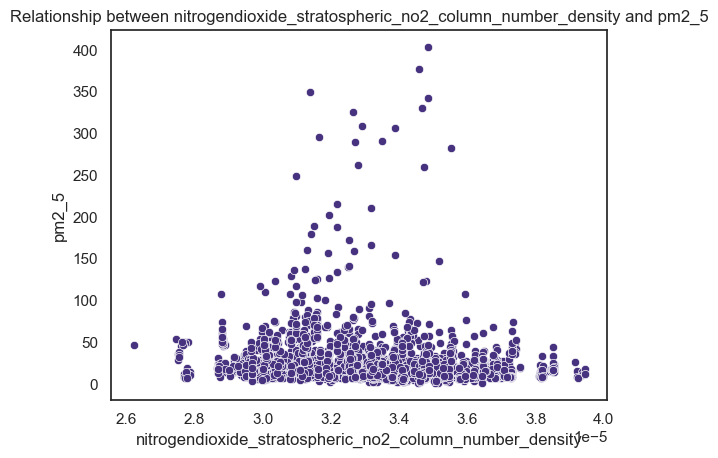

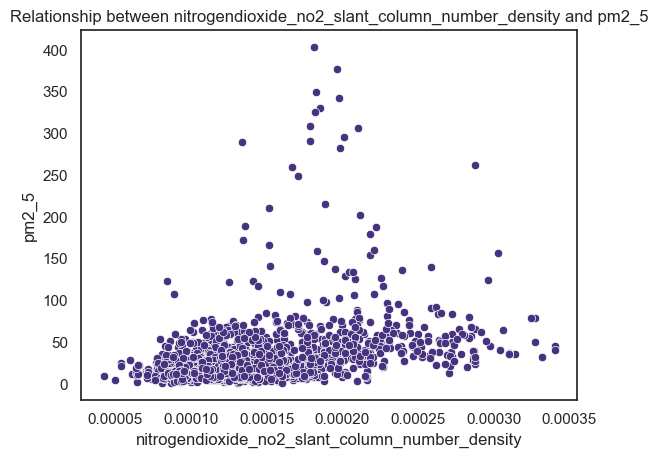

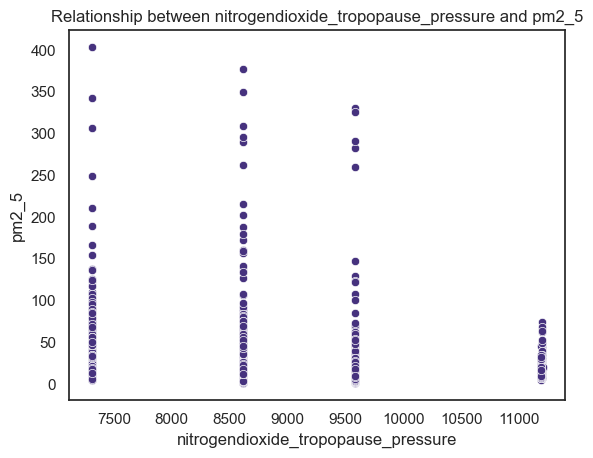

...

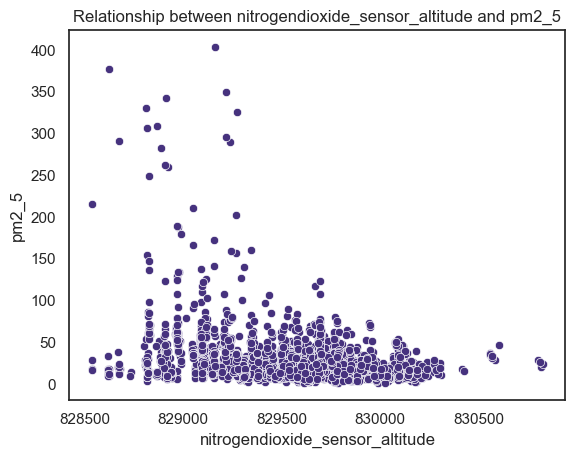

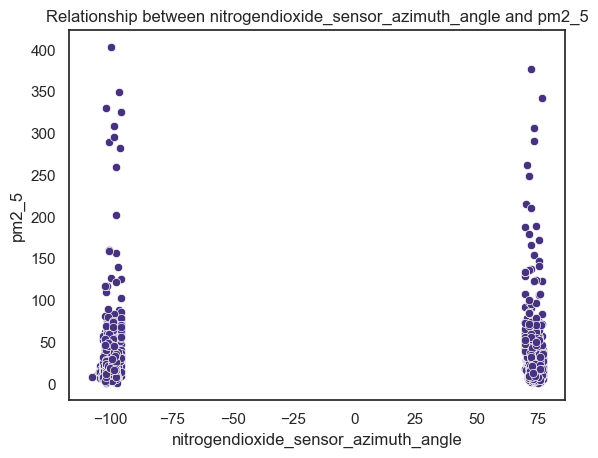

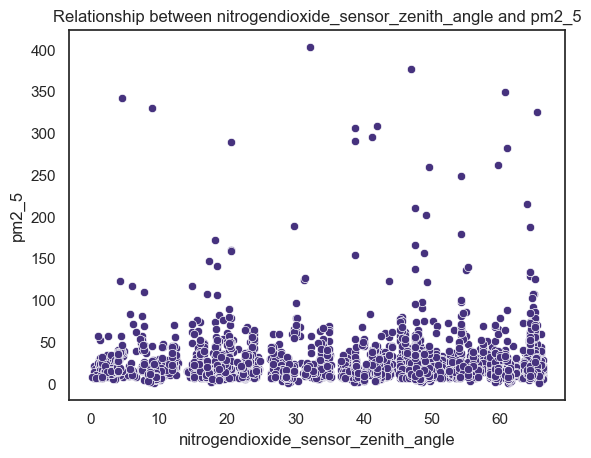

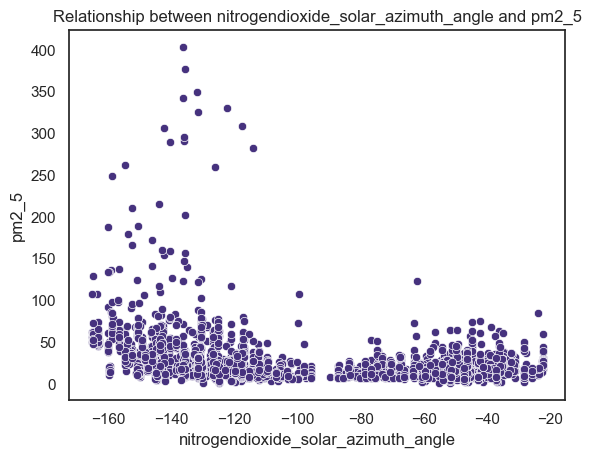

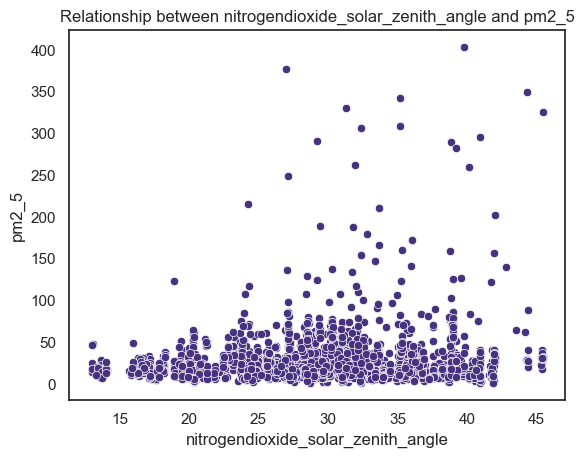

In [50]:
for col in nitrogendioxide_columns:
    plt.figure()
    sns.scatterplot(data=df, x=col, y='pm2_5')
    plt.xlabel(col)
    plt.ylabel('pm2_5')
    plt.title(f'Relationship between {col} and pm2_5')
    plt.show()

### Relation Target / Sulphurdioxide

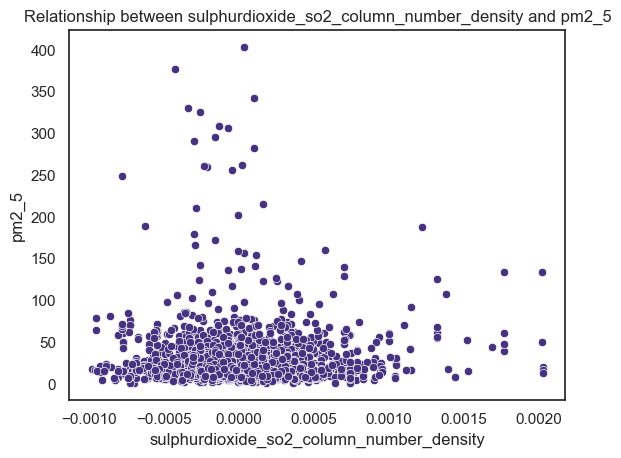

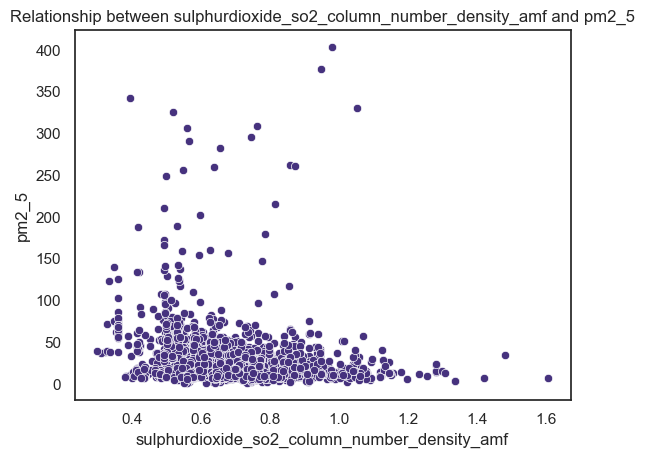

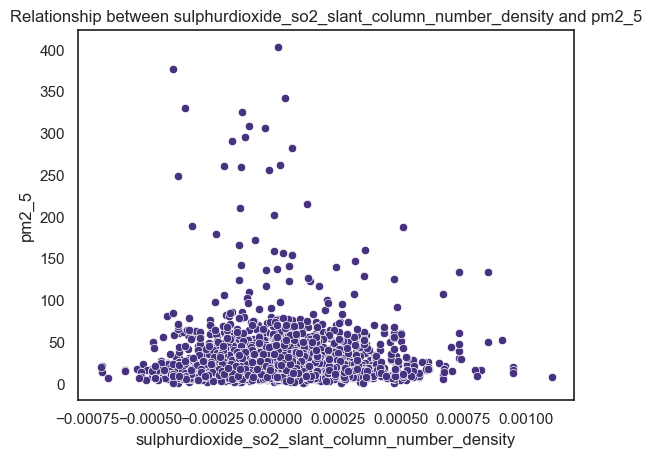

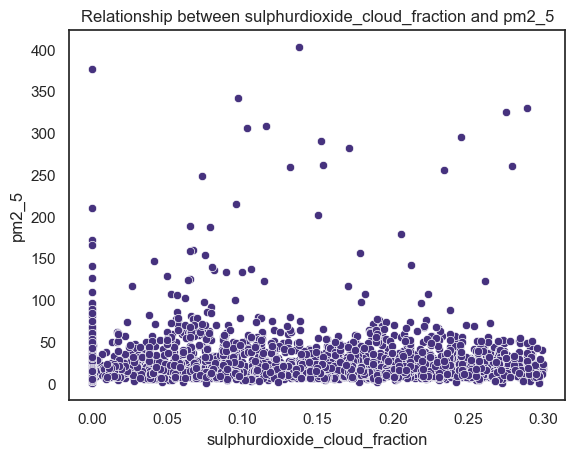

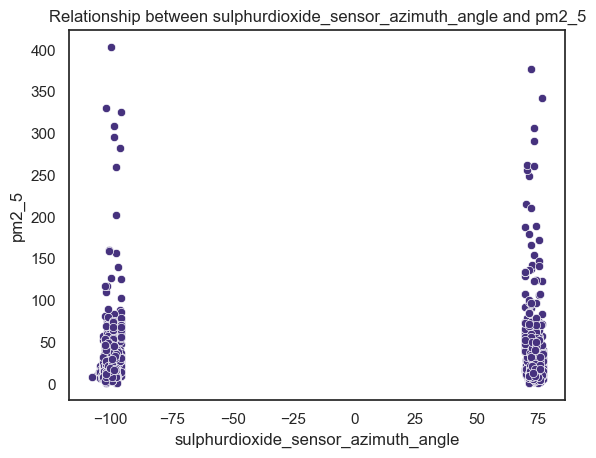

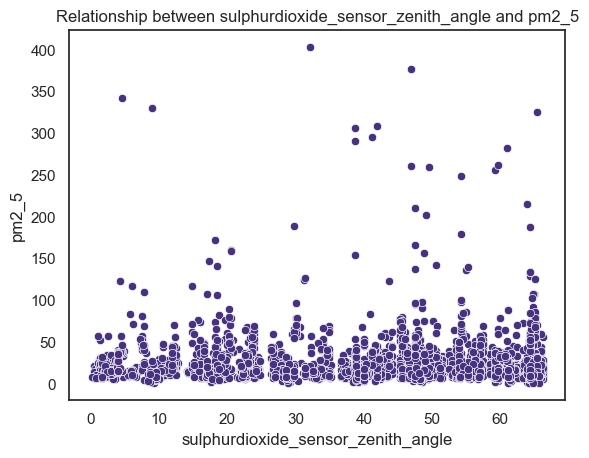

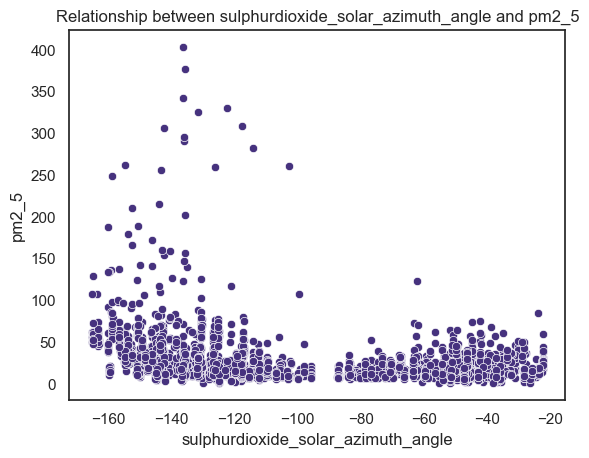

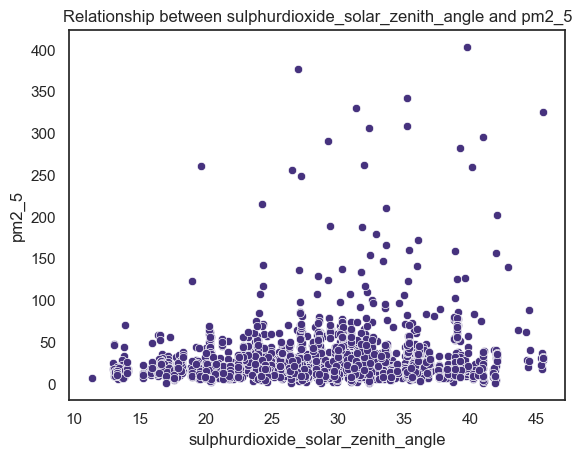

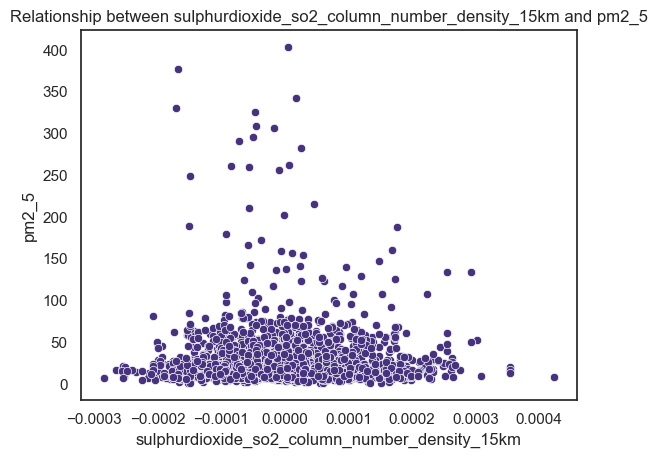

In [51]:
for col in sulphurdioxide_columns:
    plt.figure()
    sns.scatterplot(data=df, x=col, y='pm2_5')
    plt.xlabel(col)
    plt.ylabel('pm2_5')
    plt.title(f'Relationship between {col} and pm2_5')
    plt.show()

### Relation Target / Formaldehyde

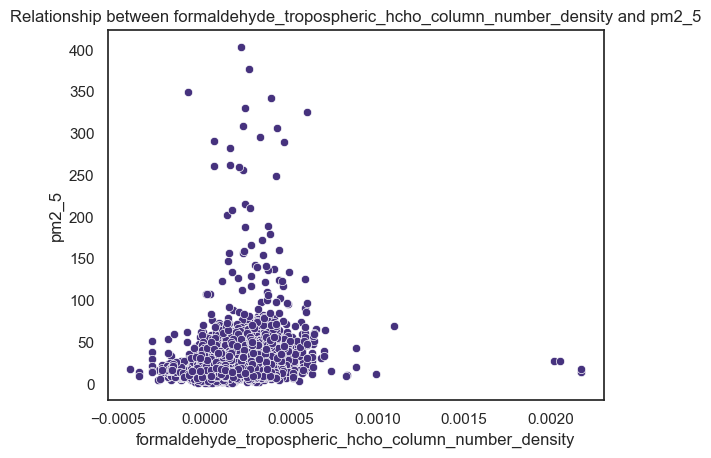

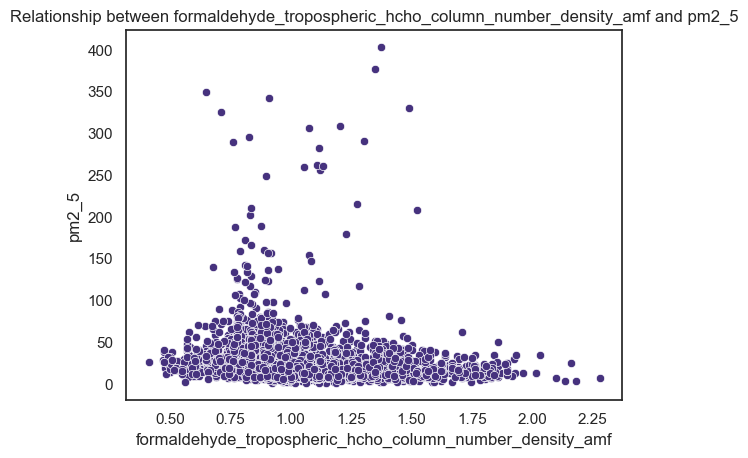

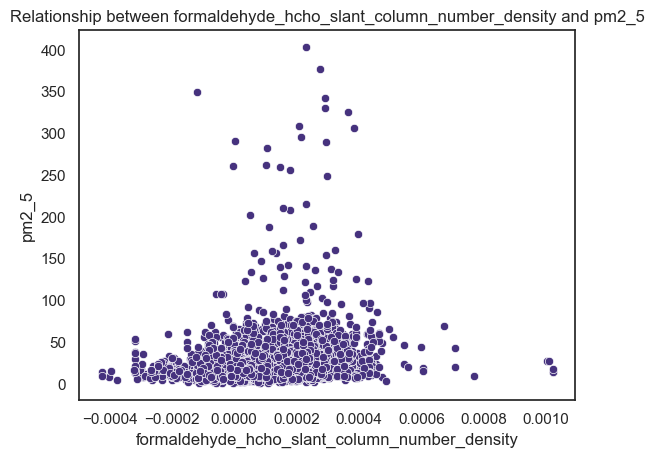

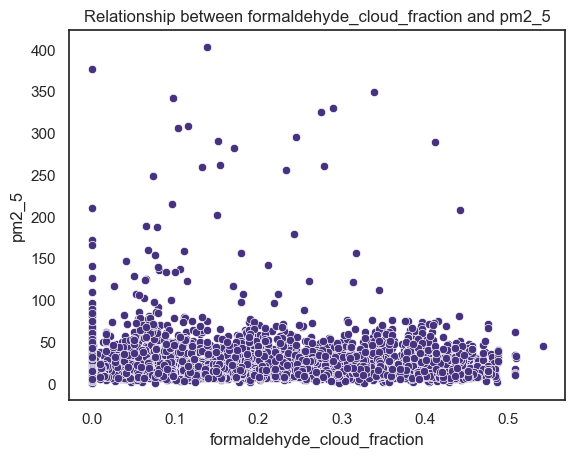

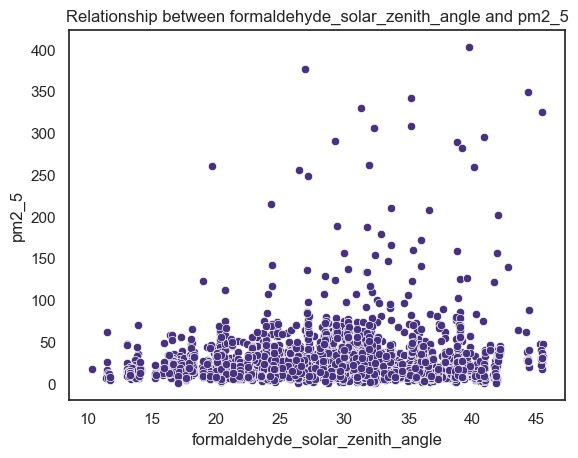

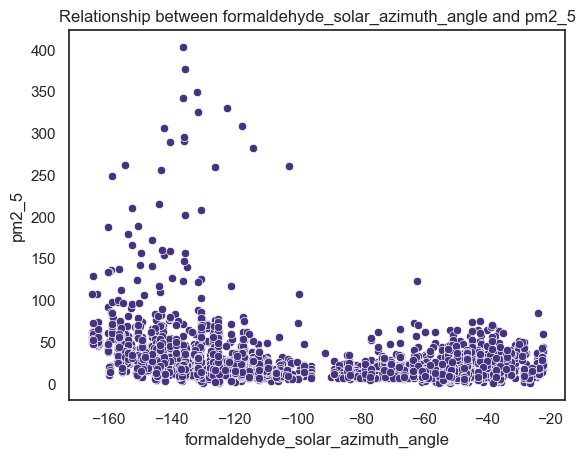

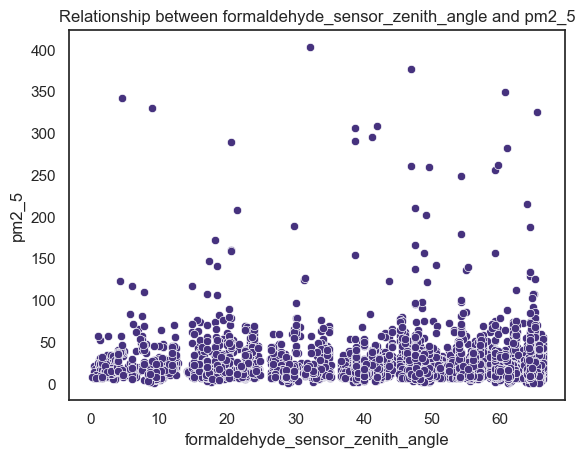

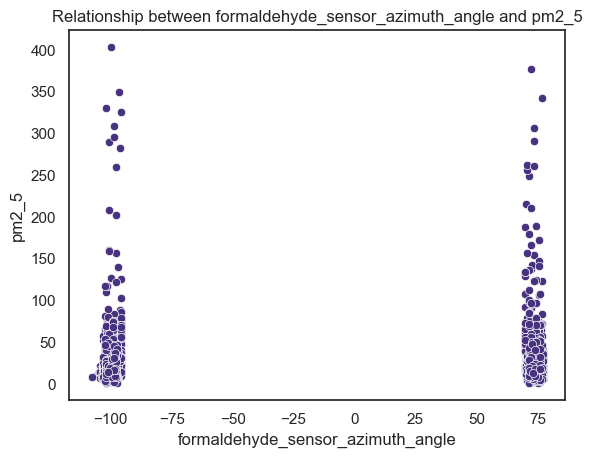

In [52]:
for col in formaldehyde_columns:
    plt.figure()
    sns.scatterplot(data=df, x=col, y='pm2_5')
    plt.xlabel(col)
    plt.ylabel('pm2_5')
    plt.title(f'Relationship between {col} and pm2_5')
    plt.show()

### Relation Target / Carbonmonoxide

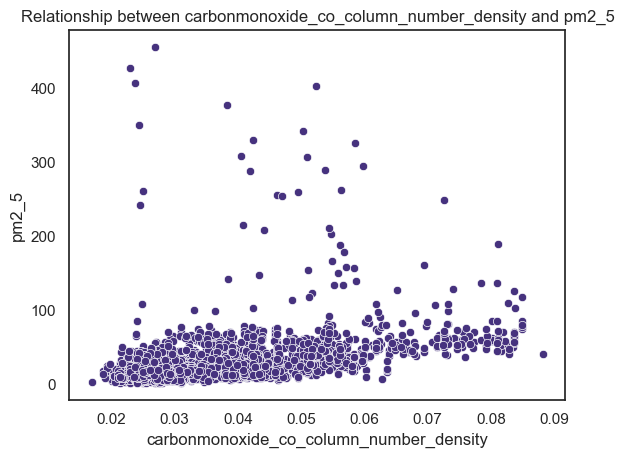

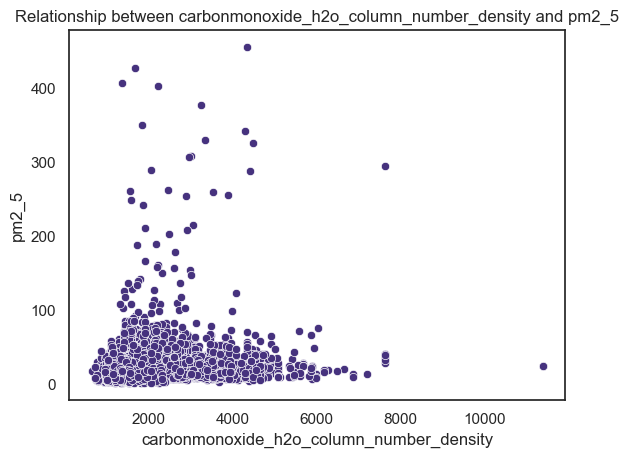

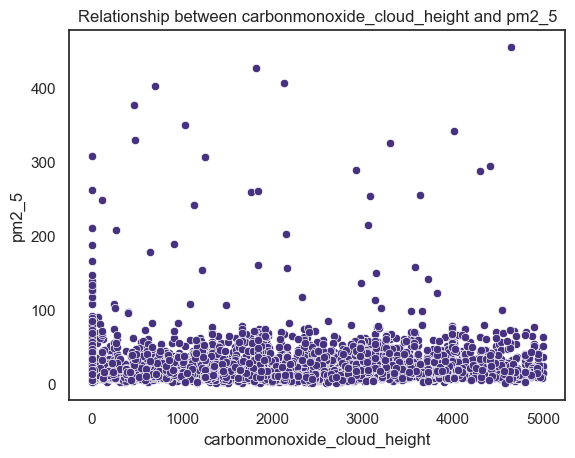

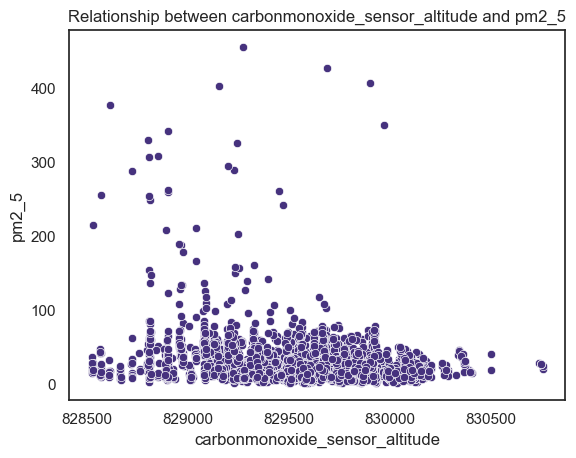

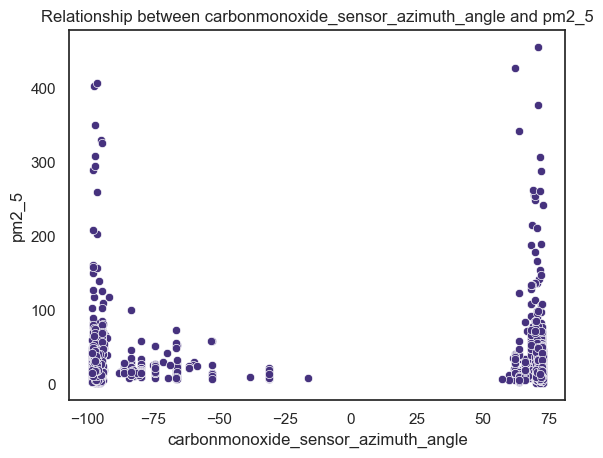

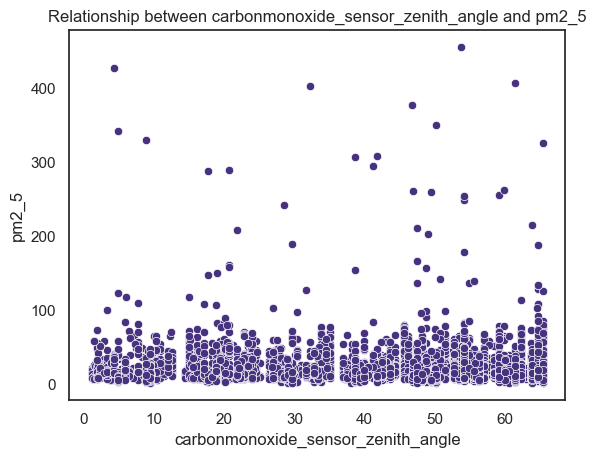

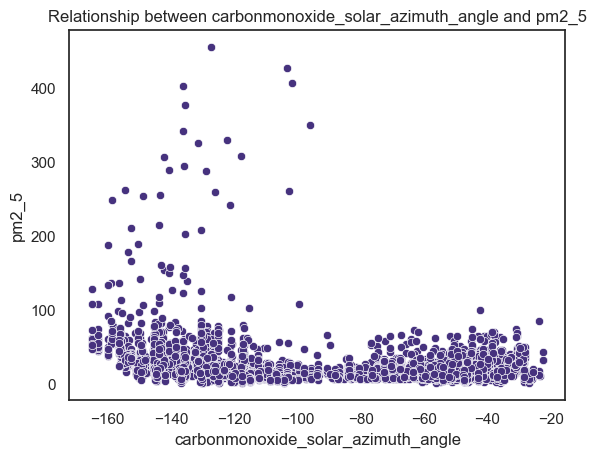

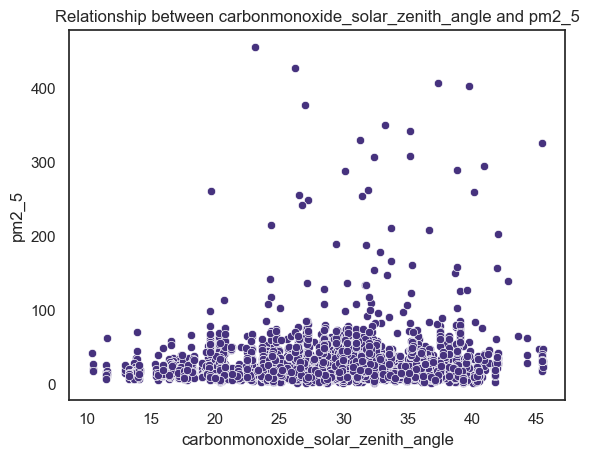

In [53]:
for col in carbonmonoxide_columns:
    plt.figure()
    sns.scatterplot(data=df, x=col, y='pm2_5')
    plt.xlabel(col)
    plt.ylabel('pm2_5')
    plt.title(f'Relationship between {col} and pm2_5')
    plt.show()

### Relation Target / Cloud

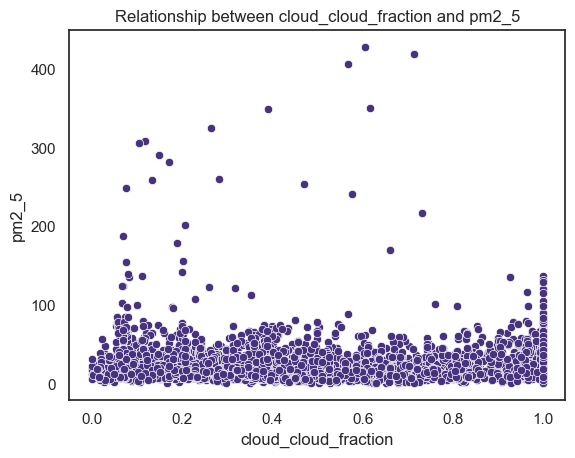

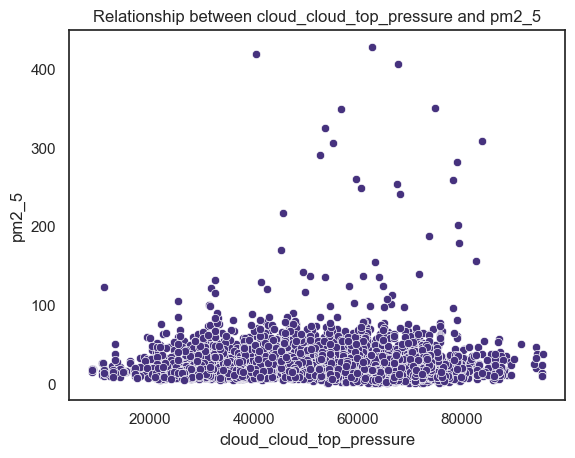

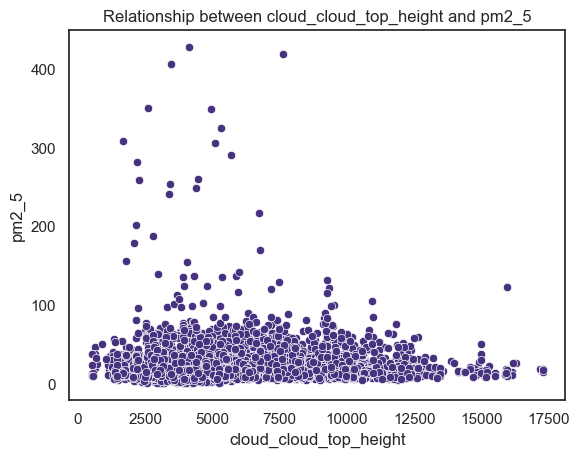

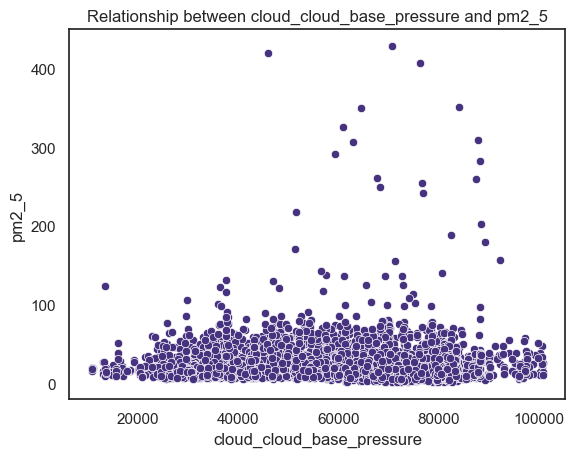

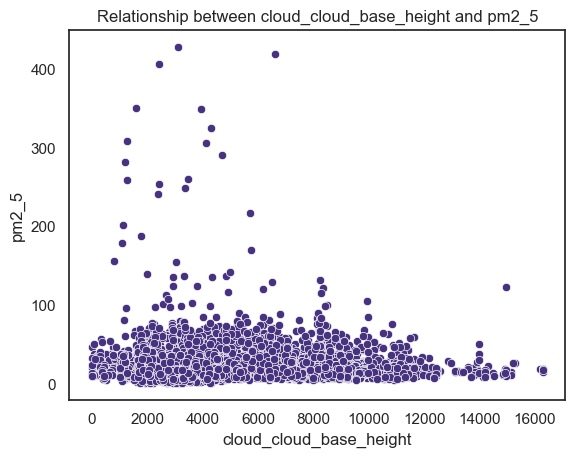

...

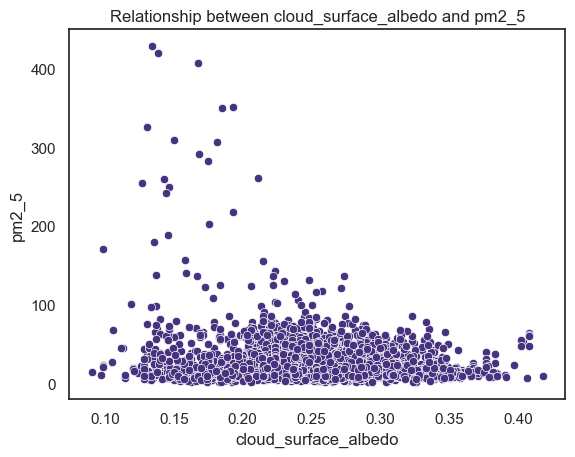

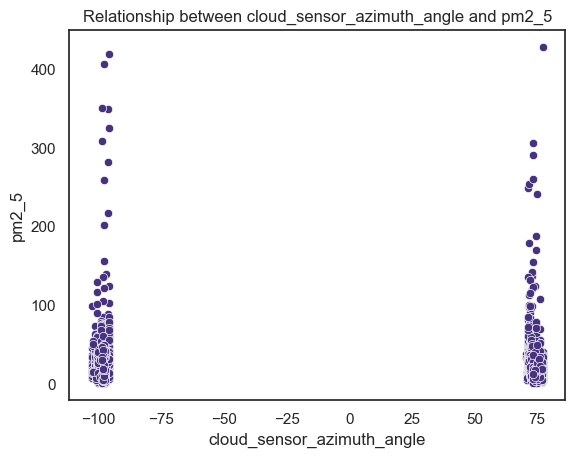

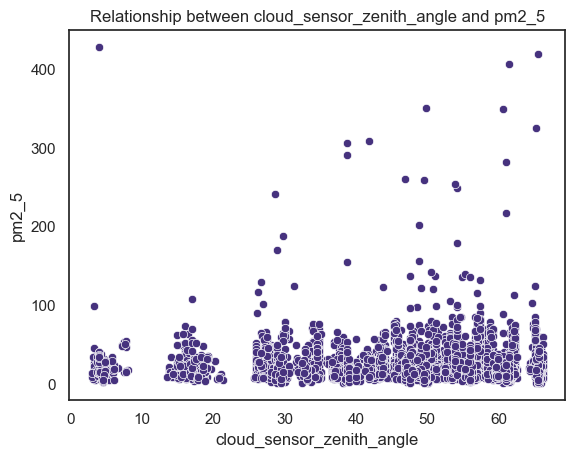

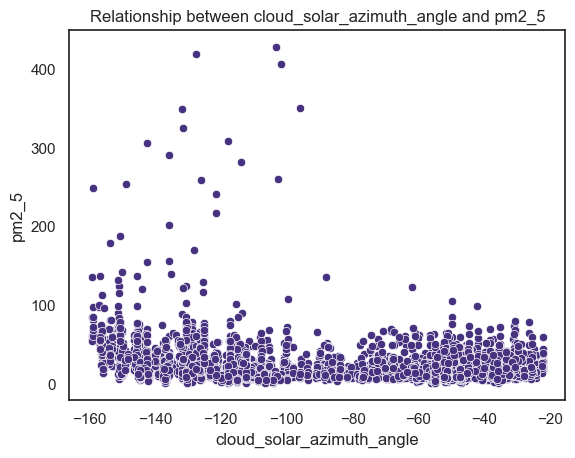

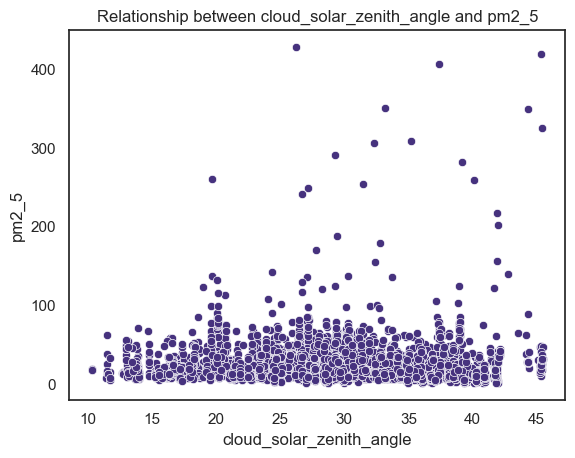

In [54]:
for col in cloud_columns:
    plt.figure()
    sns.scatterplot(data=df, x=col, y='pm2_5')
    plt.xlabel(col)
    plt.ylabel('pm2_5')
    plt.title(f'Relationship between {col} and pm2_5')
    plt.show()

### Relation Target / Ozone

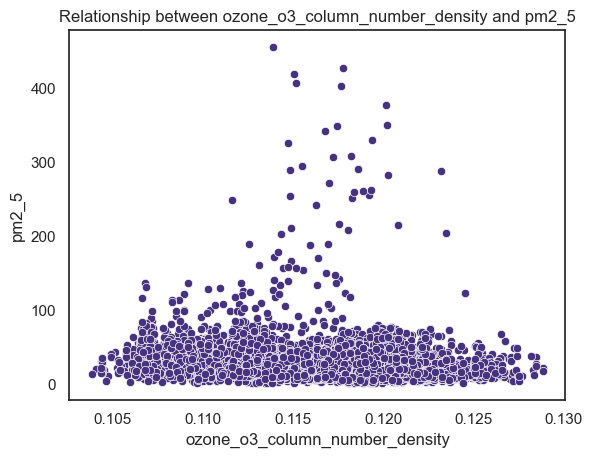

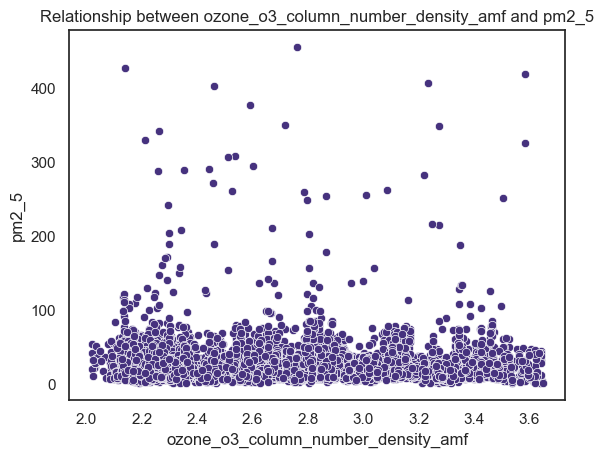

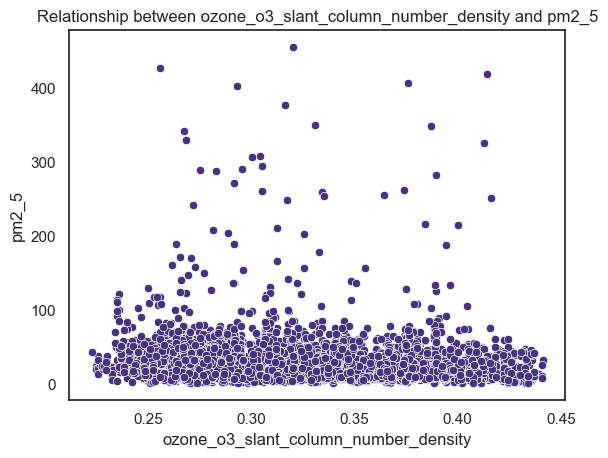

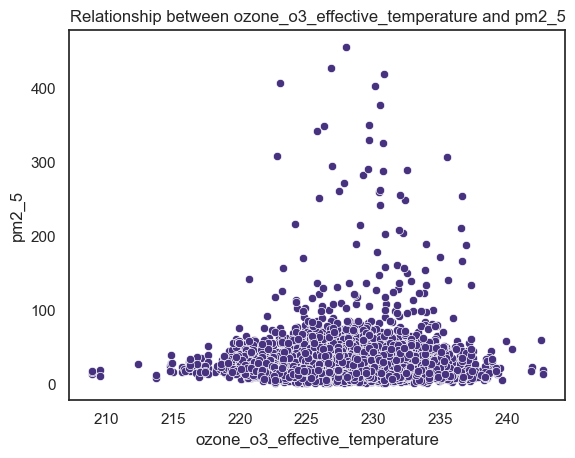

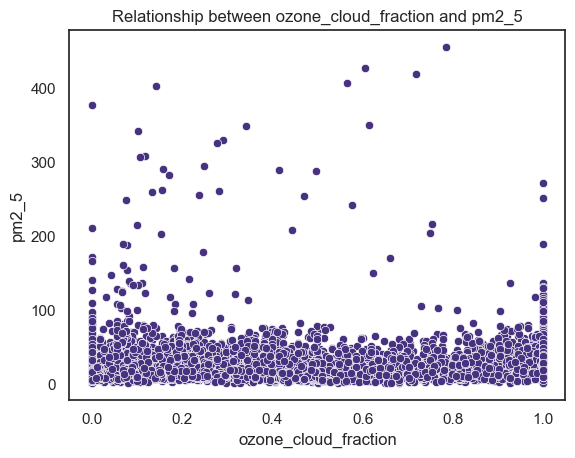

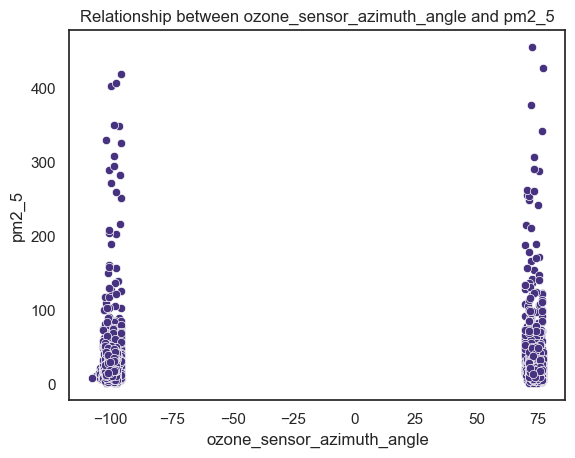

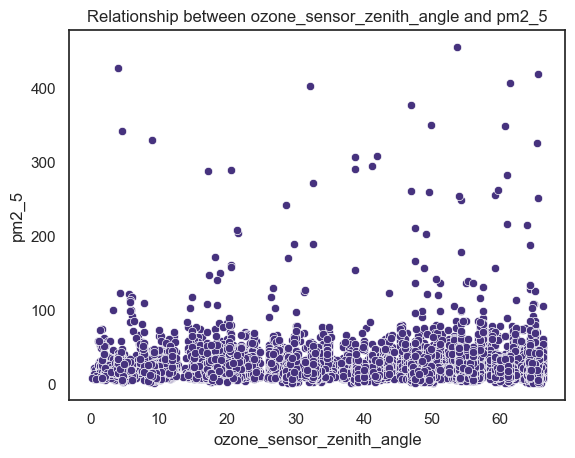

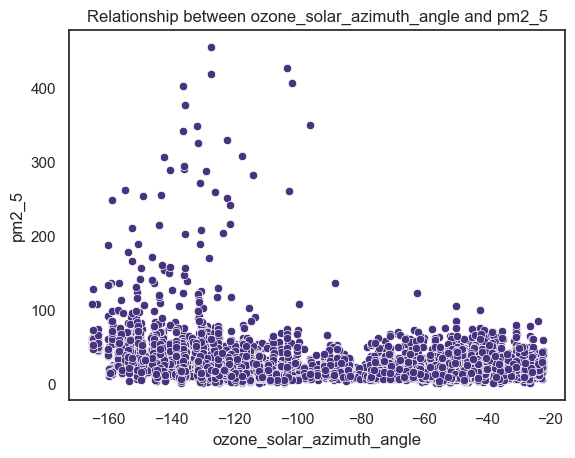

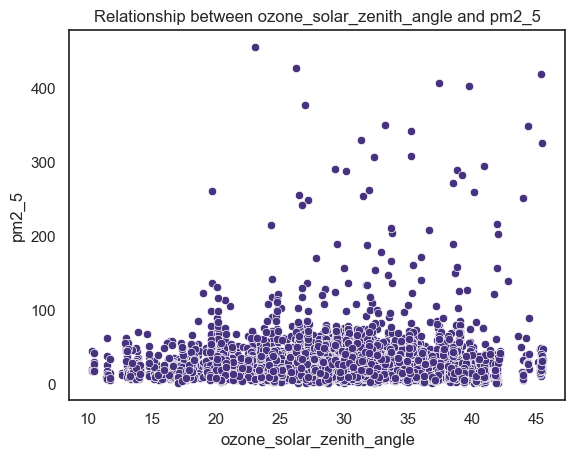

In [55]:
for col in ozone_columns:
    plt.figure()
    sns.scatterplot(data=df, x=col, y='pm2_5')
    plt.xlabel(col)
    plt.ylabel('pm2_5')
    plt.title(f'Relationship between {col} and pm2_5')
    plt.show()

### Relation Target / Uvaerosolindex

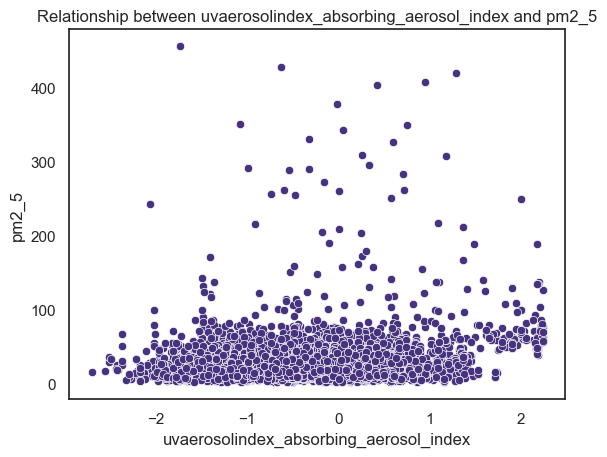

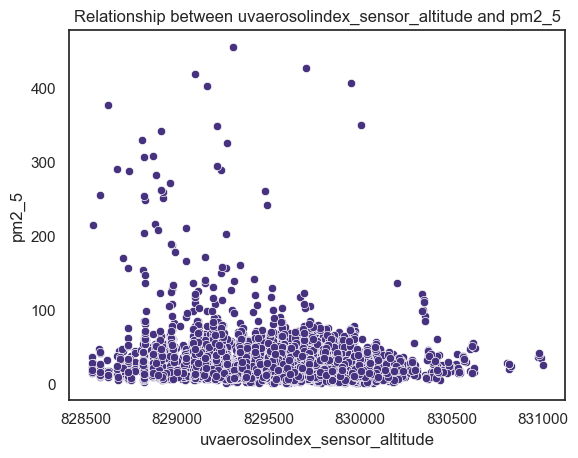

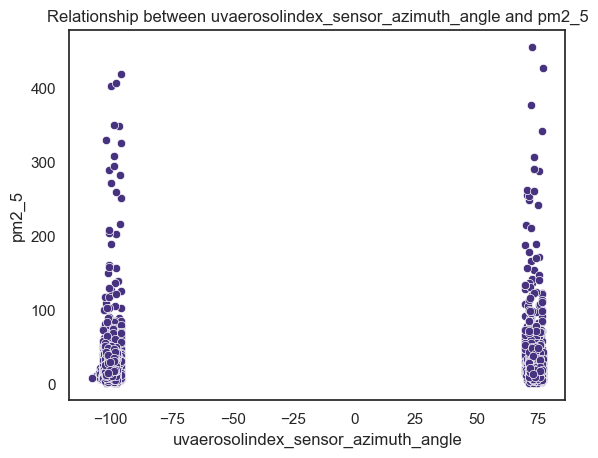

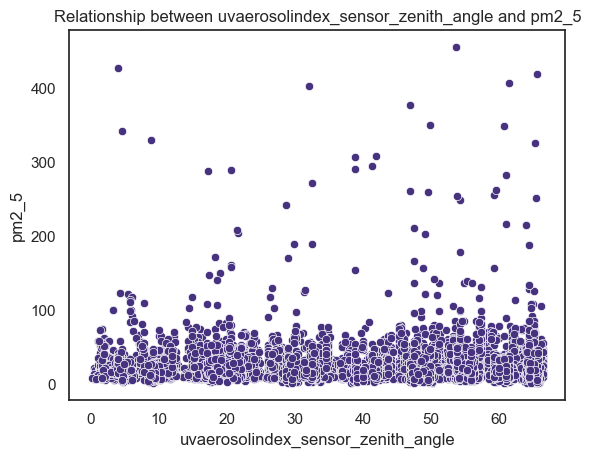

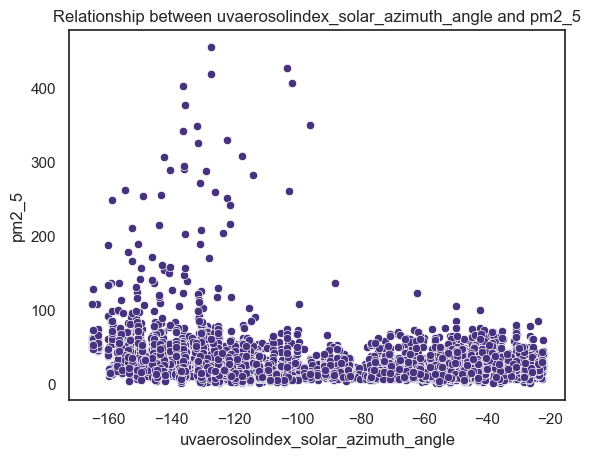

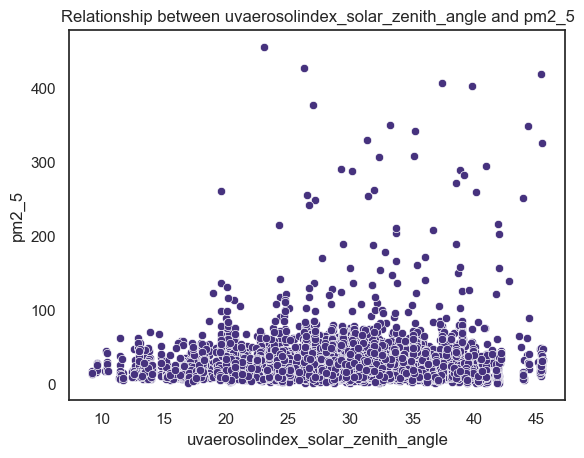

In [56]:
for col in uvaerosolindex_columns:
    plt.figure()
    sns.scatterplot(data=df, x=col, y='pm2_5')
    plt.xlabel(col)
    plt.ylabel('pm2_5')
    plt.title(f'Relationship between {col} and pm2_5')
    plt.show()

### Relation Target / City

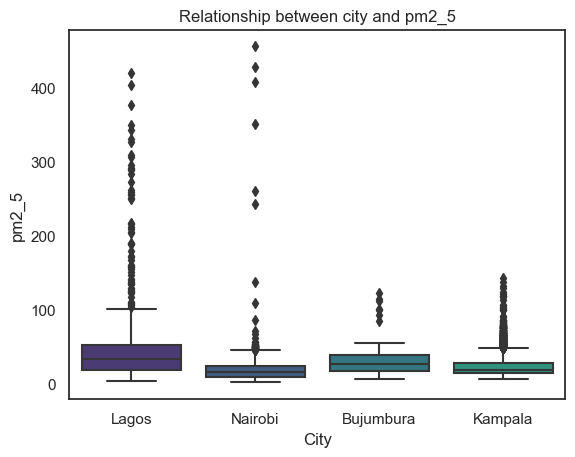

In [57]:
sns.boxplot(x='city', y='pm2_5', data=df)
plt.xlabel('City')
plt.ylabel('pm2_5')
plt.title('Relationship between city and pm2_5')
plt.show()

## Correlation Heatmap

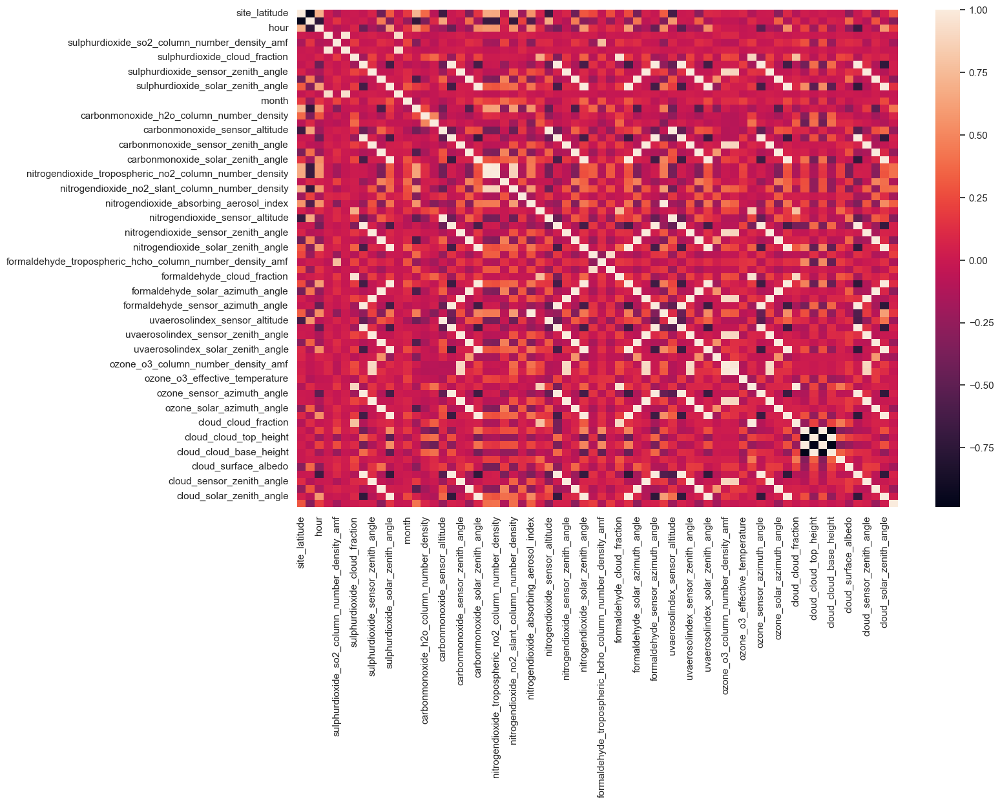

In [6]:
plt.figure(figsize=(15,10))
sns.heatmap(df.corr(numeric_only=True), annot=False)
plt.show()

In [7]:
correlation_matrix = df.corr(numeric_only=True)

mask = np.triu(np.ones_like(correlation_matrix, dtype=bool), k=1)

most_correlated_pairs = (correlation_matrix.where(mask)
                         .stack()
                         .reset_index()
                         .rename(columns={0: 'Correlation'})
                         .sort_values(by='Correlation', ascending=False))

num_most_correlated = 100
for i, (feature1, feature2, correlation) in enumerate(most_correlated_pairs.head(num_most_correlated).itertuples(index=False), 1):
    print(f"{i}. {feature1} - {feature2}: {correlation:.2f}")


1. nitrogendioxide_sensor_azimuth_angle - uvaerosolindex_sensor_azimuth_angle: 1.00
2. uvaerosolindex_sensor_azimuth_angle - ozone_sensor_azimuth_angle: 1.00
3. nitrogendioxide_sensor_azimuth_angle - ozone_sensor_azimuth_angle: 1.00
4. nitrogendioxide_sensor_azimuth_angle - formaldehyde_sensor_azimuth_angle: 1.00
5. formaldehyde_sensor_azimuth_angle - ozone_sensor_azimuth_angle: 1.00
6. formaldehyde_sensor_azimuth_angle - uvaerosolindex_sensor_azimuth_angle: 1.00
7. sulphurdioxide_sensor_azimuth_angle - formaldehyde_sensor_azimuth_angle: 1.00
8. sulphurdioxide_sensor_azimuth_angle - nitrogendioxide_sensor_azimuth_angle: 1.00
9. sulphurdioxide_sensor_azimuth_angle - ozone_sensor_azimuth_angle: 1.00
10. sulphurdioxide_sensor_azimuth_angle - uvaerosolindex_sensor_azimuth_angle: 1.00
11. uvaerosolindex_sensor_azimuth_angle - cloud_sensor_azimuth_angle: 1.00
12. ozone_sensor_azimuth_angle - cloud_sensor_azimuth_angle: 1.00
13. nitrogendioxide_sensor_azimuth_angle - cloud_sensor_azimuth_angl

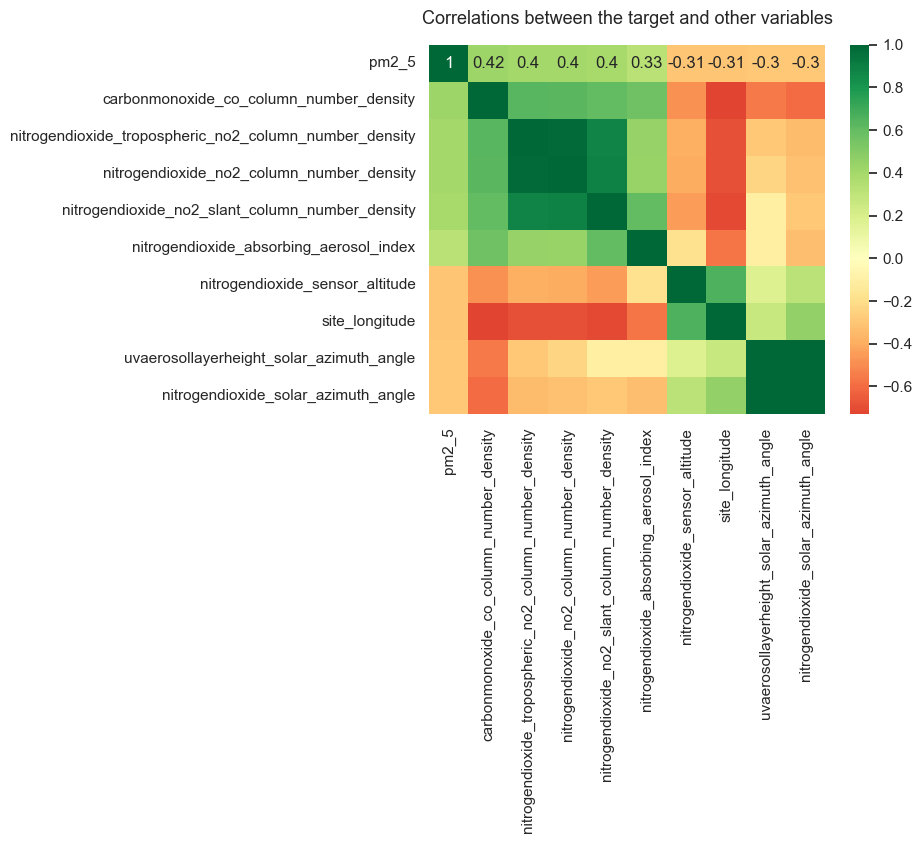

In [62]:
train_num_df = train.select_dtypes(include=['number'])

top10_corrs = abs(train_num_df.corr()['pm2_5']).sort_values(ascending = False).head(10)
corr = train_num_df[list(top10_corrs.index)].corr()
sns.heatmap(corr, cmap='RdYlGn', annot = True, center = 0)
plt.title('Correlations between the target and other variables', pad = 15, fontdict={'size': 13})
plt.show()

## Outliers in the Target

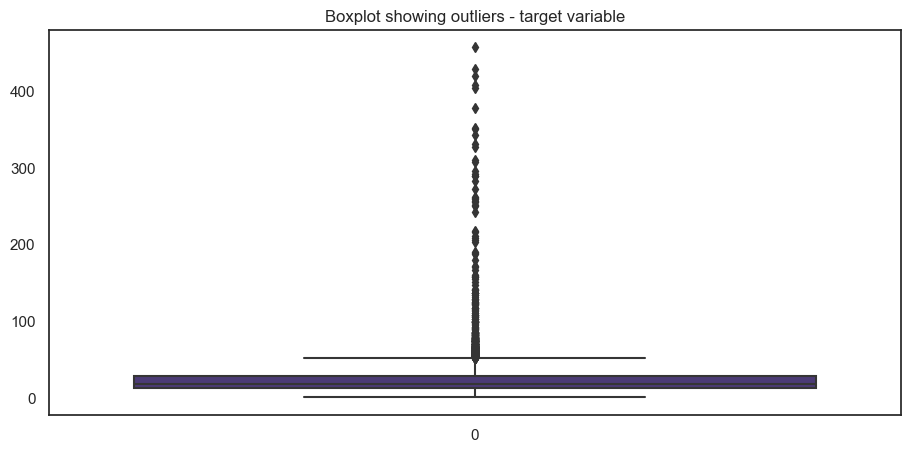

In [61]:
plt.figure(figsize = (11, 5))
sns.boxplot(train.pm2_5)
plt.title('Boxplot showing outliers - target variable')
plt.show()

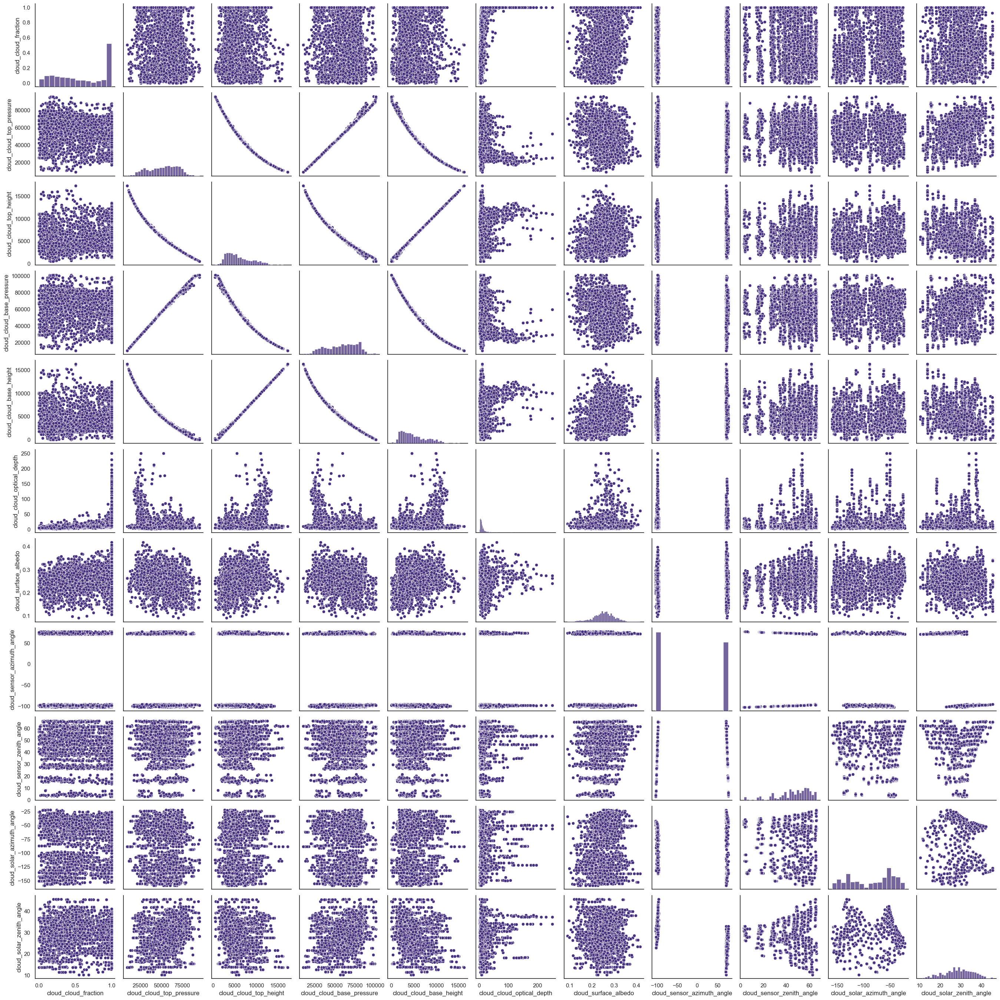

In [69]:
sns.pairplot(df[cloud_columns])

## Adversarial Validation

In [49]:
from sklearn.model_selection import StratifiedKFold
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.metrics import roc_auc_score, roc_curve
from xgboost import XGBClassifier

In [50]:
def adversarial_validation(dataset_1 = train, dataset_2 = test, label = 'Train-Test'):

    adv_train = dataset_1.drop('pm2_5', axis = 1)
    adv_test = dataset_2.copy()

    adv_train['is_test'] = 0
    adv_test['is_test'] = 1

    adv = pd.concat([adv_train, adv_test], ignore_index = True)

    adv_shuffled = adv.sample(frac = 1)

    adv_X = adv_shuffled.drop('is_test', axis = 1)
    adv_y = adv_shuffled.is_test

    skf = StratifiedKFold(n_splits = 5, random_state = 42, shuffle = True)

    val_scores = []
    predictions = np.zeros(len(adv))

    for fold, (train_idx, val_idx) in enumerate(skf.split(adv_X, adv_y)):
    
        adv_lr = make_pipeline(OneHotEncoder(handle_unknown='ignore'), XGBClassifier(random_state = 42))
        adv_lr.fit(adv_X.iloc[train_idx], adv_y.iloc[train_idx])
        
        val_preds = adv_lr.predict_proba(adv_X.iloc[val_idx])[:,1]
        predictions[val_idx] = val_preds
        val_score = roc_auc_score(adv_y.iloc[val_idx], val_preds)
        val_scores.append(val_score)
    
    fpr, tpr, _ = roc_curve(adv['is_test'], predictions)
    
    plt.figure(figsize = (10, 10), dpi = 300)
    sns.lineplot(x=[0, 1], y=[0, 1], linestyle="--", label="Indistinguishable Datasets")
    sns.lineplot(x=fpr, y=tpr, label="Adversarial Validation Classifier")
    plt.title(f'{label} Validation = {np.mean(val_scores):.5f}', weight = 'bold', size = 17)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.show()

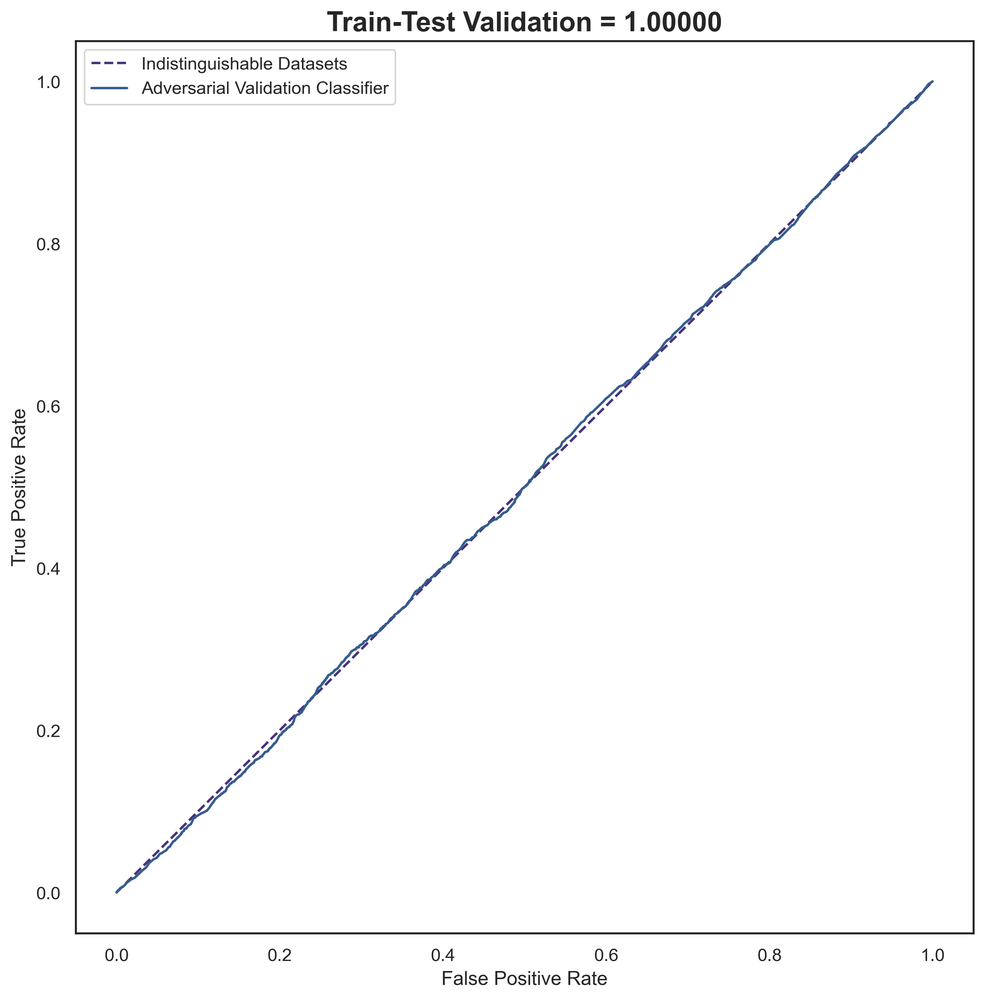

In [51]:
adversarial_validation()